In [1]:
import warnings
from tqdm import tqdm
from typing import List, Tuple

import numpy as np
import pandas as pd
import seaborn as sns
import xgboost as xgb
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel
import catboost as cb

from sklearn.metrics import r2_score, roc_auc_score
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split, cross_val_score
warnings.simplefilter("ignore")
%matplotlib inline

In [2]:
train = pd.read_csv(
    "assignment2_data/assignment_2_train.csv"
)
print("data.shape = {} rows, {} cols".format(*train.shape))
train.head(n=2)

data.shape = 9221 rows, 394 cols


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
test_leadboard = pd.read_csv(
    "assignment2_data/assignment_2_test.csv"
)
print("data.shape = {} rows, {} cols".format(*test_leadboard.shape))
test_leadboard.head(n=2)

data.shape = 8676 rows, 394 cols


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,3287000,1,7415038,226.0,W,12473,555.0,150.0,visa,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3287001,0,7415054,3072.0,W,15651,417.0,150.0,visa,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
def create_dummy_features(train: pd.DataFrame, test: pd.DataFrame) -> pd.DataFrame:
    """
    Создание One-Hot-Enconding признаков для категориальных
    переменных. Признаки создаются на основе объединенных
    train и test выборок, чтобы исключить потенциальные
    конфликты с отсутствием редких значений в одной
    из выборок.

    Parameters
    ----------
    train: pandas.core.frame.DataFrame
        Матрица признаков для обучения модели.

    test: pandas.core.frame.DataFrame
        Матрица признаков для валидации модели.

    categorical: List[str]
        Список категориальных признаков.

    Returns
    -------
    train_transformed: pandas.core.frame.DataFrame
        Преобразованная матрица признаков для обучения модели.

    test_transformed: pandas.core.frame.DataFrame
        Преобразованная матрица признаков для валидации модели.

    """
    data = pd.concat([train, test], axis=0)
    data = data.reset_index(drop=True)
#     categorical = data.select_dtypes('category').columns
    categorical = data.select_dtypes('object').columns
    

    dummy = pd.get_dummies(
        data[categorical], prefix=categorical, dummy_na=True
    )
    dummy["TransactionID"] = data["TransactionID"]

    train_transformed = train.merge(
        dummy, how="left", on="TransactionID"
    ).drop(categorical, axis=1)
    test_transformed = test.merge(
        dummy, how="left", on="TransactionID"
    ).drop(categorical, axis=1)
    
    return train_transformed, test_transformed

In [5]:
train, test_leadboard = create_dummy_features(train, test_leadboard)

In [6]:
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

In [7]:
cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5524129	test1: 0.6105438	best: 0.6105438 (0)	total: 65.9ms	remaining: 13.1s
10:	test: 0.7364803	test1: 0.7915247	best: 0.7984441 (9)	total: 176ms	remaining: 3.03s
20:	test: 0.7736371	test1: 0.8047603	best: 0.8047603 (20)	total: 287ms	remaining: 2.45s
30:	test: 0.7811022	test1: 0.7898049	best: 0.8047603 (20)	total: 381ms	remaining: 2.08s
40:	test: 0.8066142	test1: 0.8089032	best: 0.8100965 (38)	total: 468ms	remaining: 1.81s
50:	test: 0.8113730	test1: 0.8188190	best: 0.8188190 (50)	total: 562ms	remaining: 1.64s
60:	test: 0.8221691	test1: 0.8269750	best: 0.8269750 (60)	total: 648ms	remaining: 1.48s
70:	test: 0.8307906	test1: 0.8369475	best: 0.8369475 (70)	total: 739ms	remaining: 1.34s
80:	test: 0.8392772	test1: 0.8455401	best: 0.8457400 (79)	total: 836ms	remaining: 1.23s
90:	test: 0.8477469	test1: 0.8496930	best: 0.8496930 (90)	total: 930ms	remaining: 1.11s
100:	test: 0.8506240	test1: 0.8552359	best: 0.8552359 (100)	total: 1.02s	remaining: 1s
110:	test: 0.8531942	test1: 0.85827

Вывод: Качество test: 0.8540153	valid: 0.8586756

Задание 1: признак TransactionDT - это смещение в секундах относительно базовой даты. Базовая дата - 2017-12-01, преобразовать признак TransactionDT в datetime, прибавив к базовой дате исходное значение признака. Из полученного признака выделить год, месяц, день недели, час, день.

In [8]:
train['TransactionDT'] = pd.to_datetime(train['TransactionDT'], unit='s', origin=pd.Timestamp('2017-12-01'))
test_leadboard['TransactionDT'] = pd.to_datetime(test_leadboard['TransactionDT'], unit='s', origin=pd.Timestamp('2017-12-01'))

In [9]:
train['year'] = pd.DatetimeIndex(train['TransactionDT']).year
train['month'] = pd.DatetimeIndex(train['TransactionDT']).month
train['day'] = pd.DatetimeIndex(train['TransactionDT']).day
train['hour'] = pd.DatetimeIndex(train['TransactionDT']).hour

test_leadboard['year'] = pd.DatetimeIndex(test_leadboard['TransactionDT']).year
test_leadboard['month'] = pd.DatetimeIndex(test_leadboard['TransactionDT']).month
test_leadboard['day'] = pd.DatetimeIndex(test_leadboard['TransactionDT']).day
test_leadboard['hour'] = pd.DatetimeIndex(test_leadboard['TransactionDT']).hour

In [10]:
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5271713	test1: 0.5458927	best: 0.5458927 (0)	total: 9.71ms	remaining: 1.93s
10:	test: 0.6899949	test1: 0.7503850	best: 0.7503850 (10)	total: 123ms	remaining: 2.12s
20:	test: 0.7521602	test1: 0.7678901	best: 0.7774793 (19)	total: 223ms	remaining: 1.9s
30:	test: 0.7497724	test1: 0.7761594	best: 0.7774793 (19)	total: 315ms	remaining: 1.72s
40:	test: 0.7946104	test1: 0.8133328	best: 0.8133328 (40)	total: 399ms	remaining: 1.55s
50:	test: 0.8006469	test1: 0.8176625	best: 0.8176625 (50)	total: 480ms	remaining: 1.4s
60:	test: 0.8209216	test1: 0.8369741	best: 0.8369741 (60)	total: 570ms	remaining: 1.3s
70:	test: 0.8279932	test1: 0.8463866	best: 0.8463866 (70)	total: 651ms	remaining: 1.18s
80:	test: 0.8372162	test1: 0.8545726	best: 0.8545726 (80)	total: 741ms	remaining: 1.09s
90:	test: 0.8474108	test1: 0.8624719	best: 0.8624719 (90)	total: 833ms	remaining: 998ms
100:	test: 0.8535625	test1: 0.8650417	best: 0.8650417 (99)	total: 924ms	remaining: 906ms
110:	test: 0.8557325	test1: 0.86503

Вывод: Качество test: 0.8559457 valid: 0.8664216

Задание 2: сделать конкатенацию признаков
* card1 + card2;
* card1 + card2 + card_3 + card_5;
* card1 + card2 + card_3 + card_5 + addr1 + addr2

In [11]:
train['card12'] = (train['card1'] + train['card2']).astype('str')

In [12]:
train['card1235'] = (train['card1'] + train['card2'] + train['card3'] + train['card5']).astype('str')

In [13]:
train['card1235addr12'] = (train['card1'] + train['card2'] + train['card3'] + train['card5'] +\
                           train['addr1'] + train['addr2']).astype('str')

In [14]:
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

categorical_features_indices = np.where(x_train.dtypes == 'object')[0]

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    cat_features=categorical_features_indices,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5717041	test1: 0.5145454	best: 0.5145454 (0)	total: 34.1ms	remaining: 6.79s
10:	test: 0.7131687	test1: 0.7168879	best: 0.7224607 (3)	total: 325ms	remaining: 5.58s
20:	test: 0.7351446	test1: 0.7419724	best: 0.7468386 (15)	total: 614ms	remaining: 5.24s
30:	test: 0.7468457	test1: 0.7633705	best: 0.7696666 (27)	total: 915ms	remaining: 4.99s
40:	test: 0.7881552	test1: 0.7960077	best: 0.7975542 (39)	total: 1.2s	remaining: 4.66s
50:	test: 0.8477092	test1: 0.8165059	best: 0.8165059 (50)	total: 1.5s	remaining: 4.38s
60:	test: 0.8592861	test1: 0.8245152	best: 0.8251152 (57)	total: 1.76s	remaining: 4.02s
70:	test: 0.8819911	test1: 0.8385407	best: 0.8387073 (69)	total: 2.08s	remaining: 3.77s
80:	test: 0.8957927	test1: 0.8458734	best: 0.8458734 (80)	total: 2.33s	remaining: 3.43s
90:	test: 0.8982069	test1: 0.8463733	best: 0.8467133 (88)	total: 2.6s	remaining: 3.11s
100:	test: 0.9003561	test1: 0.8472466	best: 0.8472466 (100)	total: 2.86s	remaining: 2.81s
110:	test: 0.8998482	test1: 0.84637

Вывод: Качество test: 0.9227071 valid: 0.8574457 (Категориальные признаки значительно повышают качество модели на тесте, падает на валидации)

Задание 3: Сделать FrequencyEncoder для признаков card1 - card6, addr1, addr2.

In [15]:
features = ['card1', 'card2', 'card3', 'card5', 'addr1', 'addr2']

In [16]:
for feat in features:
    card = (train.groupby([feat])[feat].agg(['count']) / train.shape[0]).\
            rename(columns={'count': f'{feat}_freq'})
    train = train.merge(card, on=[feat], how='left')
#     break


In [17]:
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

categorical_features_indices = np.where(x_train.dtypes == 'object')[0]

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    cat_features=categorical_features_indices,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5602543	test1: 0.5585149	best: 0.5585149 (0)	total: 36.2ms	remaining: 7.21s
10:	test: 0.7167715	test1: 0.7385193	best: 0.7385193 (10)	total: 341ms	remaining: 5.87s
20:	test: 0.7467567	test1: 0.7473652	best: 0.7536980 (14)	total: 674ms	remaining: 5.74s
30:	test: 0.7482505	test1: 0.7481385	best: 0.7536980 (14)	total: 977ms	remaining: 5.33s
40:	test: 0.7898139	test1: 0.7961710	best: 0.7961710 (40)	total: 1.27s	remaining: 4.94s
50:	test: 0.8016371	test1: 0.8040170	best: 0.8040170 (50)	total: 1.57s	remaining: 4.58s
60:	test: 0.8512281	test1: 0.8236220	best: 0.8236220 (60)	total: 1.84s	remaining: 4.2s
70:	test: 0.8879784	test1: 0.8437269	best: 0.8437269 (70)	total: 2.12s	remaining: 3.85s
80:	test: 0.8961200	test1: 0.8474732	best: 0.8474732 (80)	total: 2.38s	remaining: 3.5s
90:	test: 0.8977563	test1: 0.8489798	best: 0.8490331 (87)	total: 2.69s	remaining: 3.22s
100:	test: 0.8990733	test1: 0.8463933	best: 0.8490331 (87)	total: 2.96s	remaining: 2.9s
110:	test: 0.8998313	test1: 0.84680

Вывод: Добавление этого признака ухудшило модель и на трейне и на валидции

Задание 4: Создать признаки на основе отношения: TransactionAmt к вычисленной статистике. Статистика - среднее значение / стандартное отклонение TransactionAmt, сгруппированное по card1 - card6, addr1, addr2, и по признакам, созданным в задании 2.

In [18]:
features = ['card1', 'card2', 'card3', 'card5', 'addr1', 'addr2', 'card12', 'card1235', 'card1235addr12']

In [19]:
for feat in features:
    card = train.groupby([feat]).TransactionAmt.agg(['mean', 'std']).\
            rename(columns={'mean': f'TransactionAmt_{feat}_mean', 'std':f'TransactionAmt_{feat}_std'})
    train = train.merge(card, on=[feat], how='left')
#     break

In [20]:
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5620314	test1: 0.5943552	best: 0.5943552 (0)	total: 8.15ms	remaining: 1.62s
10:	test: 0.7326757	test1: 0.7650770	best: 0.7661036 (5)	total: 100ms	remaining: 1.73s
20:	test: 0.7765345	test1: 0.7955577	best: 0.7955577 (20)	total: 188ms	remaining: 1.6s
30:	test: 0.7880483	test1: 0.8036637	best: 0.8044836 (29)	total: 276ms	remaining: 1.51s
40:	test: 0.7967431	test1: 0.8058902	best: 0.8058902 (40)	total: 367ms	remaining: 1.43s
50:	test: 0.8152259	test1: 0.8164092	best: 0.8164092 (50)	total: 460ms	remaining: 1.34s
60:	test: 0.8267690	test1: 0.8271350	best: 0.8283149 (59)	total: 551ms	remaining: 1.26s
70:	test: 0.8349199	test1: 0.8325745	best: 0.8332078 (69)	total: 637ms	remaining: 1.16s
80:	test: 0.8440933	test1: 0.8470966	best: 0.8471566 (79)	total: 725ms	remaining: 1.06s
90:	test: 0.8522586	test1: 0.8534327	best: 0.8534327 (90)	total: 815ms	remaining: 977ms
100:	test: 0.8564663	test1: 0.8566991	best: 0.8566991 (100)	total: 918ms	remaining: 900ms
110:	test: 0.8585697	test1: 0.858

Вывод: Качество test: 0.8625926	test1: 0.8571790 (Качество не сильно поднялось на валидации)

Задание 5: Создать признаки на основе отношения: D15 к вычисленной статистике. Статистика - среднее значение / стандартное отклонение D15, сгруппированное по card1 - card6, addr1, addr2, и по признакам, созданным в задании 2.

In [21]:
features = ['card1', 'card2', 'card3', 'card5', 'addr1', 'addr2', 'card12', 'card1235', 'card1235addr12']

In [22]:
for feat in features:
    card = train.groupby([feat]).D15.agg(['mean', 'std']).\
            rename(columns={'mean': f'{feat}_mean', 'std':f'{feat}_std'})
    train = train.merge(card, on=[feat], how='left')
#     break

In [23]:
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5018181	test1: 0.5233780	best: 0.5233780 (0)	total: 10.7ms	remaining: 2.13s
10:	test: 0.7452060	test1: 0.7684734	best: 0.7684734 (10)	total: 103ms	remaining: 1.77s
20:	test: 0.7520081	test1: 0.7779426	best: 0.7779426 (20)	total: 190ms	remaining: 1.62s
30:	test: 0.7685884	test1: 0.7865352	best: 0.7870818 (29)	total: 282ms	remaining: 1.54s
40:	test: 0.7886880	test1: 0.8001040	best: 0.8002040 (39)	total: 370ms	remaining: 1.44s
50:	test: 0.8092734	test1: 0.8108297	best: 0.8108297 (50)	total: 461ms	remaining: 1.35s
60:	test: 0.8173379	test1: 0.8146427	best: 0.8146427 (60)	total: 550ms	remaining: 1.25s
70:	test: 0.8305642	test1: 0.8200223	best: 0.8200223 (70)	total: 640ms	remaining: 1.16s
80:	test: 0.8401102	test1: 0.8298414	best: 0.8298414 (80)	total: 731ms	remaining: 1.07s
90:	test: 0.8473446	test1: 0.8346343	best: 0.8347677 (89)	total: 823ms	remaining: 985ms
100:	test: 0.8533234	test1: 0.8406671	best: 0.8406671 (100)	total: 923ms	remaining: 904ms
110:	test: 0.8559941	test1: 0.8

Вывод: Качество модели начинает снижаться с добавлением новых признаков

In [24]:
train['TransactionAmt_int'], train['TransactionAmt_frac'] = train['TransactionAmt']\
            .apply(lambda x: np.modf(x)[1]), train['TransactionAmt'].apply(lambda x: np.modf(x)[0])

In [25]:
train['TransactionAmt_log'] = train['TransactionAmt'].apply(lambda x: np.log(x))

In [26]:
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6240475	test1: 0.6847007	best: 0.6847007 (0)	total: 11.7ms	remaining: 2.32s
10:	test: 0.7513735	test1: 0.7898849	best: 0.7913348 (9)	total: 155ms	remaining: 2.67s
20:	test: 0.7694116	test1: 0.8144661	best: 0.8167459 (18)	total: 263ms	remaining: 2.24s
30:	test: 0.8003883	test1: 0.8333478	best: 0.8333478 (30)	total: 352ms	remaining: 1.92s
40:	test: 0.8130831	test1: 0.8375541	best: 0.8375541 (40)	total: 442ms	remaining: 1.71s
50:	test: 0.8244014	test1: 0.8426736	best: 0.8426736 (50)	total: 534ms	remaining: 1.56s
60:	test: 0.8343222	test1: 0.8469833	best: 0.8502596 (57)	total: 622ms	remaining: 1.42s
70:	test: 0.8463298	test1: 0.8490664	best: 0.8507063 (66)	total: 714ms	remaining: 1.3s
80:	test: 0.8548800	test1: 0.8541326	best: 0.8541326 (79)	total: 805ms	remaining: 1.18s
90:	test: 0.8595066	test1: 0.8577523	best: 0.8581990 (89)	total: 895ms	remaining: 1.07s
100:	test: 0.8629818	test1: 0.8611720	best: 0.8612120 (99)	total: 1s	remaining: 982ms
110:	test: 0.8663298	test1: 0.8646584

Выводы: Эти признаки увеличили качество модели test: 0.8524307 test1: 0.8611320

## Урок 6. Feature Engineering, Feature Selection, part II

Задание 0: выбрать любимую модель и схему валидации решения, зафиксировать базовое качество модели.

In [27]:
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6240475	test1: 0.6847007	best: 0.6847007 (0)	total: 10.4ms	remaining: 2.06s
10:	test: 0.7513735	test1: 0.7898849	best: 0.7913348 (9)	total: 110ms	remaining: 1.9s
20:	test: 0.7694116	test1: 0.8144661	best: 0.8167459 (18)	total: 205ms	remaining: 1.75s
30:	test: 0.8003883	test1: 0.8333478	best: 0.8333478 (30)	total: 296ms	remaining: 1.61s
40:	test: 0.8130831	test1: 0.8375541	best: 0.8375541 (40)	total: 382ms	remaining: 1.48s
50:	test: 0.8244014	test1: 0.8426736	best: 0.8426736 (50)	total: 483ms	remaining: 1.41s
60:	test: 0.8343222	test1: 0.8469833	best: 0.8502596 (57)	total: 567ms	remaining: 1.29s
70:	test: 0.8463298	test1: 0.8490664	best: 0.8507063 (66)	total: 652ms	remaining: 1.19s
80:	test: 0.8548800	test1: 0.8541326	best: 0.8541326 (79)	total: 746ms	remaining: 1.1s
90:	test: 0.8595066	test1: 0.8577523	best: 0.8581990 (89)	total: 836ms	remaining: 1s
100:	test: 0.8629818	test1: 0.8611720	best: 0.8612120 (99)	total: 966ms	remaining: 947ms
110:	test: 0.8663298	test1: 0.8646584	

### Задание 1: использовать внутренний способ для оценки важности признаков алгоритма, вывести его в виде диаграммы.

In [28]:
model_feat = pd.DataFrame({'features': x_train.columns,\
              'FeatureImportance': model.get_feature_importance(type= "FeatureImportance")}).\
                sort_values('FeatureImportance', ascending=False)

In [29]:
model_feat.head(2)

,features,FeatureImportance
20,C12,5.627817
389,card6_debit,5.238700


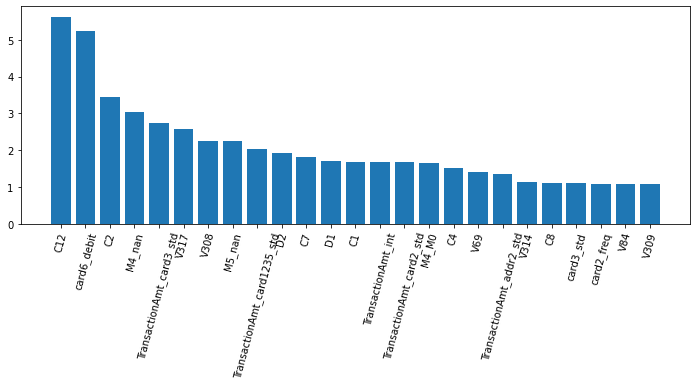

In [30]:
plt.figure(figsize = (12, 4))
plt.bar(model_feat.iloc[:25]['features'], model_feat.iloc[:25]['FeatureImportance'])
plt.xticks(rotation=75);

### Задание 2: удалить признаки с нулевой или маленькой важностью, переобучить модель и оценить изменение качества.

In [31]:
features_important = model_feat[model_feat['FeatureImportance'] > 0.01]['features'].tolist()

In [32]:
train[features_important].head(2)

,C12,card6_debit,C2,M4_nan,TransactionAmt_card3_std,V317,V308,M5_nan,TransactionAmt_card1235_std,D2,...,V180,C10,V88,V322,V205,V206,addr1_mean,V237,card1_std,V100
0,0.0,0,1.0,0,227.686284,117.0,0.0,0,408.632549,NaN,...,NaN,0.0,1.0,NaN,NaN,NaN,232.992337,NaN,NaN,0.0
1,0.0,0,1.0,0,227.686284,0.0,0.0,0,153.803993,NaN,...,NaN,0.0,1.0,NaN,NaN,NaN,238.597368,NaN,277.419508,0.0


In [33]:
x_train, x_valid = train_test_split(
    train[features_important], train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model2 = cb.CatBoostClassifier(**cb_params)
model2.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5549941	test1: 0.6020878	best: 0.6020878 (0)	total: 8.79ms	remaining: 1.75s
10:	test: 0.7693010	test1: 0.7733396	best: 0.7733396 (10)	total: 82.7ms	remaining: 1.42s
20:	test: 0.8040216	test1: 0.8274483	best: 0.8274483 (20)	total: 147ms	remaining: 1.25s
30:	test: 0.8189513	test1: 0.8328278	best: 0.8328678 (29)	total: 216ms	remaining: 1.18s
40:	test: 0.8261560	test1: 0.8355276	best: 0.8355276 (40)	total: 281ms	remaining: 1.09s
50:	test: 0.8311573	test1: 0.8384807	best: 0.8384807 (50)	total: 342ms	remaining: 1000ms
60:	test: 0.8386189	test1: 0.8374874	best: 0.8384807 (50)	total: 410ms	remaining: 933ms
70:	test: 0.8460992	test1: 0.8405938	best: 0.8424137 (68)	total: 478ms	remaining: 869ms
80:	test: 0.8529546	test1: 0.8452401	best: 0.8460933 (76)	total: 543ms	remaining: 798ms
90:	test: 0.8572760	test1: 0.8492597	best: 0.8492597 (90)	total: 608ms	remaining: 729ms
100:	test: 0.8591666	test1: 0.8523595	best: 0.8523595 (100)	total: 681ms	remaining: 668ms
110:	test: 0.8586655	test1: 0

Выводы:Удаление нулевых признаков ускорило оубчение модели, но уменьшило метрику качтества

### Задание 3: использовать permutation importance, выполнить задание 1 и 2.

In [35]:
# Снова посчитаем модель на всех предыдущих признаках
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6240475	test1: 0.6847007	best: 0.6847007 (0)	total: 11.4ms	remaining: 2.28s
10:	test: 0.7513735	test1: 0.7898849	best: 0.7913348 (9)	total: 122ms	remaining: 2.1s
20:	test: 0.7694116	test1: 0.8144661	best: 0.8167459 (18)	total: 222ms	remaining: 1.89s
30:	test: 0.8003883	test1: 0.8333478	best: 0.8333478 (30)	total: 323ms	remaining: 1.76s
40:	test: 0.8130831	test1: 0.8375541	best: 0.8375541 (40)	total: 428ms	remaining: 1.66s
50:	test: 0.8244014	test1: 0.8426736	best: 0.8426736 (50)	total: 532ms	remaining: 1.55s
60:	test: 0.8343222	test1: 0.8469833	best: 0.8502596 (57)	total: 633ms	remaining: 1.44s
70:	test: 0.8463298	test1: 0.8490664	best: 0.8507063 (66)	total: 736ms	remaining: 1.34s
80:	test: 0.8548800	test1: 0.8541326	best: 0.8541326 (79)	total: 843ms	remaining: 1.24s
90:	test: 0.8595066	test1: 0.8577523	best: 0.8581990 (89)	total: 960ms	remaining: 1.15s
100:	test: 0.8629818	test1: 0.8611720	best: 0.8612120 (99)	total: 1.06s	remaining: 1.04s
110:	test: 0.8663298	test1: 0.8646

In [36]:
from sklearn.inspection import permutation_importance

importance = permutation_importance(
    model, x_valid, y_valid, scoring="roc_auc", n_jobs=6, random_state=27
)

In [37]:
importance_scores = pd.DataFrame({
    "features": x_valid.columns,
    "importance-mean": importance.importances_mean,
    "importance-std": importance.importances_std,
})
importance_scores = importance_scores.sort_values(
    by="importance-mean", ascending=False
)
importance_scores = importance_scores.reset_index(drop=True)
decrease_scores = importance_scores[importance_scores["importance-mean"]<=0]
decrease_scores = decrease_scores.reset_index(drop=True)

In [46]:
features_important = importance_scores[importance_scores['importance-mean'] > 0.0]['features'].tolist()

In [48]:
x_train, x_valid = train_test_split(
    train[features_important], train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6530657	test1: 0.7085686	best: 0.7085686 (0)	total: 8.3ms	remaining: 1.65s
10:	test: 0.7513688	test1: 0.7646704	best: 0.7731163 (8)	total: 85.1ms	remaining: 1.46s
20:	test: 0.7702026	test1: 0.7846920	best: 0.7846920 (20)	total: 160ms	remaining: 1.36s
30:	test: 0.7782912	test1: 0.7832688	best: 0.7851053 (21)	total: 226ms	remaining: 1.23s
40:	test: 0.7965685	test1: 0.7977342	best: 0.7981542 (39)	total: 288ms	remaining: 1.12s
50:	test: 0.8054688	test1: 0.8099565	best: 0.8099565 (50)	total: 348ms	remaining: 1.02s
60:	test: 0.8095867	test1: 0.8149027	best: 0.8154693 (58)	total: 411ms	remaining: 937ms
70:	test: 0.8189648	test1: 0.8312413	best: 0.8312413 (70)	total: 486ms	remaining: 883ms
80:	test: 0.8384392	test1: 0.8455934	best: 0.8458667 (79)	total: 545ms	remaining: 801ms
90:	test: 0.8445036	test1: 0.8515262	best: 0.8515262 (90)	total: 606ms	remaining: 726ms
100:	test: 0.8465078	test1: 0.8543660	best: 0.8546393 (99)	total: 671ms	remaining: 658ms
110:	test: 0.8489869	test1: 0.856

Выводы: Обучение модели стало быстрее, но метрика почти как прежняя( чуть хуже). Но получаем укорение обучение модели

### Задание 4: использовать BoostARoota для отбора признаков (настраивать или нет - на ваше усмотрение), переобучить модель и оценить изменение качества.

In [ ]:
# Снова посчитаем модель на всех предыдущих признаках
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

In [49]:
# ! pip install boostaroota

In [50]:
from boostaroota import BoostARoota

In [ ]:
features = ['card1235', 'card1235addr12', 'card12']
for reat in features:
    train[]

In [58]:
# Переведем наши признаки из категориальных в float
features = ['card1235', 'card1235addr12', 'card12']
for feat in features:
    x_train[feat] = x_train[feat].astype('float32')

br = BoostARoota(metric='auc')
br.fit(x_train, y_train)

[12:27:56] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Round:  1  iteration:  1
[12:27:57] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Round:  1  iteration:  2
[12:27:57] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to som

In [59]:
br.keep_vars_

0     card6_debit
1              C2
2              C1
3          M4_nan
4             V30
         ...     
83           V316
84            V40
85           V155
86           V228
88           V134
Name: feature, Length: 83, dtype: object

In [61]:
# Снова посчитаем модель на всех предыдущих признаках
x_train, x_valid = train_test_split(
    br.transform(train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1)), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5542883	test1: 0.5713705	best: 0.5713705 (0)	total: 5.48ms	remaining: 1.09s
10:	test: 0.7118321	test1: 0.7496017	best: 0.7632938 (6)	total: 58.3ms	remaining: 1s
20:	test: 0.7691119	test1: 0.8021371	best: 0.8044103 (16)	total: 115ms	remaining: 984ms
30:	test: 0.7941407	test1: 0.8122563	best: 0.8155560 (27)	total: 169ms	remaining: 922ms
40:	test: 0.8226816	test1: 0.8261884	best: 0.8261884 (40)	total: 220ms	remaining: 852ms
50:	test: 0.8301713	test1: 0.8330611	best: 0.8340544 (48)	total: 266ms	remaining: 777ms
60:	test: 0.8398618	test1: 0.8400472	best: 0.8400472 (60)	total: 309ms	remaining: 705ms
70:	test: 0.8478525	test1: 0.8457800	best: 0.8460200 (67)	total: 352ms	remaining: 640ms
80:	test: 0.8497270	test1: 0.8479132	best: 0.8479132 (80)	total: 398ms	remaining: 584ms
90:	test: 0.8541747	test1: 0.8552525	best: 0.8552525 (90)	total: 445ms	remaining: 533ms
100:	test: 0.8609267	test1: 0.8632252	best: 0.8632252 (100)	total: 488ms	remaining: 478ms
110:	test: 0.8645884	test1: 0.8639

Выводы: БустаРута отобрал меньше всего признаков по сравнениию с другими методами, но метрика осталась почти на том же уровне. Что говорит о неплохой работе этого метода

### Задание 5: использовать shap, выполнить задание 1 и 2.

In [71]:
# Снова посчитаем модель на всех предыдущих признаках
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6240475	test1: 0.6847007	best: 0.6847007 (0)	total: 12.8ms	remaining: 2.55s
10:	test: 0.7513735	test1: 0.7898849	best: 0.7913348 (9)	total: 114ms	remaining: 1.96s
20:	test: 0.7694116	test1: 0.8144661	best: 0.8167459 (18)	total: 207ms	remaining: 1.77s
30:	test: 0.8003883	test1: 0.8333478	best: 0.8333478 (30)	total: 300ms	remaining: 1.63s
40:	test: 0.8130831	test1: 0.8375541	best: 0.8375541 (40)	total: 392ms	remaining: 1.52s
50:	test: 0.8244014	test1: 0.8426736	best: 0.8426736 (50)	total: 483ms	remaining: 1.41s
60:	test: 0.8343222	test1: 0.8469833	best: 0.8502596 (57)	total: 567ms	remaining: 1.29s
70:	test: 0.8463298	test1: 0.8490664	best: 0.8507063 (66)	total: 660ms	remaining: 1.2s
80:	test: 0.8548800	test1: 0.8541326	best: 0.8541326 (79)	total: 747ms	remaining: 1.1s
90:	test: 0.8595066	test1: 0.8577523	best: 0.8581990 (89)	total: 836ms	remaining: 1s
100:	test: 0.8629818	test1: 0.8611720	best: 0.8612120 (99)	total: 946ms	remaining: 928ms
110:	test: 0.8663298	test1: 0.8646584	

In [72]:
# ! pip install shap

In [64]:
import shap

In [73]:
x_valid_, y_valid_ = x_valid, y_valid
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(x_valid_, y_valid_)

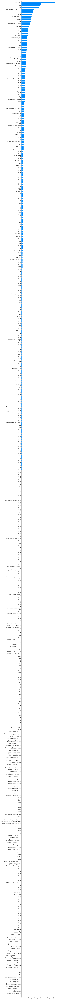

In [74]:
shap.summary_plot(shap_values, x_valid_, plot_type="bar", max_display=x_valid_.shape[1])

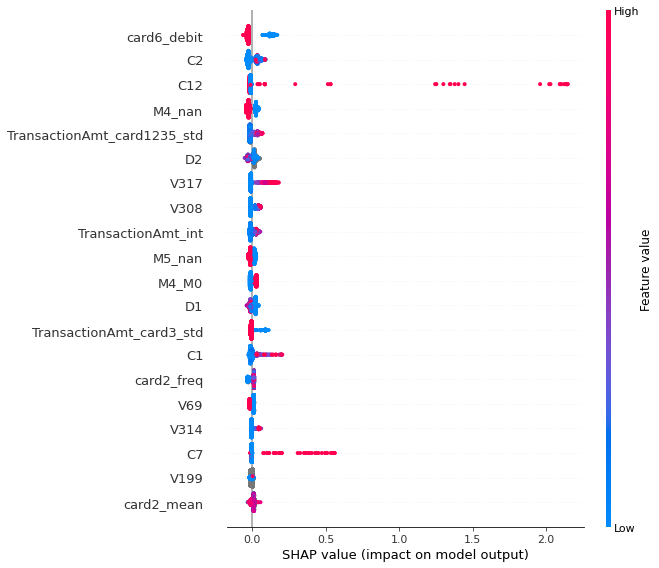

In [75]:
shap.summary_plot(shap_values, x_valid_)

In [104]:
model_sharp_feat = pd.DataFrame({'features': x_valid_.columns,\
              'FeatureImportance': shap_values[0]}).\
                sort_values('FeatureImportance', ascending=False).reset_index(drop=True)

In [105]:
model_sharp_feat

,features,FeatureImportance
0,card6_debit,0.151748
1,TransactionAmt_card3_std,0.096688
2,TransactionAmt_addr2_mean,0.038976
3,M4_nan,0.038321
4,TransactionAmt_addr2_std,0.034020
...,...,...
568,M5_nan,-0.013371
569,TransactionAmt_card1235_std,-0.013787
570,C12,-0.018458
571,C1,-0.022376


In [117]:
# Выделим признаки с ненулевым вкладом модели
features_important = model_sharp_feat[np.abs(model_sharp_feat['FeatureImportance']) > 0.0]['features'].tolist()

In [118]:
len(features_important)

377

In [119]:
x_train, x_valid = train_test_split(
    train[features_important], train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model2 = cb.CatBoostClassifier(**cb_params)
model2.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5470810	test1: 0.5177851	best: 0.5177851 (0)	total: 10.8ms	remaining: 2.15s
10:	test: 0.7840089	test1: 0.8204389	best: 0.8241419 (7)	total: 109ms	remaining: 1.86s
20:	test: 0.7849665	test1: 0.7981042	best: 0.8241419 (7)	total: 195ms	remaining: 1.66s
30:	test: 0.8019398	test1: 0.8146427	best: 0.8241419 (7)	total: 274ms	remaining: 1.49s
40:	test: 0.8009597	test1: 0.8126396	best: 0.8241419 (7)	total: 356ms	remaining: 1.38s
50:	test: 0.8147550	test1: 0.8172492	best: 0.8241419 (7)	total: 433ms	remaining: 1.26s
60:	test: 0.8311577	test1: 0.8315313	best: 0.8319579 (59)	total: 517ms	remaining: 1.18s
70:	test: 0.8414184	test1: 0.8380807	best: 0.8380807 (70)	total: 611ms	remaining: 1.11s
80:	test: 0.8483586	test1: 0.8422670	best: 0.8422670 (80)	total: 706ms	remaining: 1.04s
90:	test: 0.8519101	test1: 0.8444401	best: 0.8444401 (90)	total: 798ms	remaining: 956ms
100:	test: 0.8567156	test1: 0.8489131	best: 0.8489131 (100)	total: 896ms	remaining: 879ms
110:	test: 0.8599084	test1: 0.851152

Выводы: Ненулевых признаков досаточно много. Смогли избавиться примерно от 35% нулевых признака. Качество на валидации чуть просело

### Задание 6: построить shap.summary_plot и shap.decision_plot для небольшой группы примеров (определить размер самостоятельно) и проанализировать влияние признаков на поведение модели.

In [120]:
# Снова посчитаем модель на всех предыдущих признаках
x_train, x_valid = train_test_split(
    train.drop(["TransactionID", "TransactionDT", "isFraud"], axis=1), train_size=0.75, shuffle=True, random_state=1,
)
y_train, y_valid = train_test_split(
    train["isFraud"], train_size=0.75, shuffle=True, random_state=1,
)

cb_params = {
    "n_estimators": 200,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 10,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 42
}

model = cb.CatBoostClassifier(**cb_params)
model.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_train, y_train), (x_valid, y_valid)],
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6240475	test1: 0.6847007	best: 0.6847007 (0)	total: 10.2ms	remaining: 2.04s
10:	test: 0.7513735	test1: 0.7898849	best: 0.7913348 (9)	total: 107ms	remaining: 1.83s
20:	test: 0.7694116	test1: 0.8144661	best: 0.8167459 (18)	total: 202ms	remaining: 1.72s
30:	test: 0.8003883	test1: 0.8333478	best: 0.8333478 (30)	total: 298ms	remaining: 1.63s
40:	test: 0.8130831	test1: 0.8375541	best: 0.8375541 (40)	total: 388ms	remaining: 1.5s
50:	test: 0.8244014	test1: 0.8426736	best: 0.8426736 (50)	total: 513ms	remaining: 1.5s
60:	test: 0.8343222	test1: 0.8469833	best: 0.8502596 (57)	total: 619ms	remaining: 1.41s
70:	test: 0.8463298	test1: 0.8490664	best: 0.8507063 (66)	total: 729ms	remaining: 1.32s
80:	test: 0.8548800	test1: 0.8541326	best: 0.8541326 (79)	total: 828ms	remaining: 1.22s
90:	test: 0.8595066	test1: 0.8577523	best: 0.8581990 (89)	total: 938ms	remaining: 1.12s
100:	test: 0.8629818	test1: 0.8611720	best: 0.8612120 (99)	total: 1.04s	remaining: 1.02s
110:	test: 0.8663298	test1: 0.86465

In [122]:
# Посчитаем Sharp
x_valid_, y_valid_ = x_valid.sample(2000), y_valid.sample(2000)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(x_valid_, y_valid_)

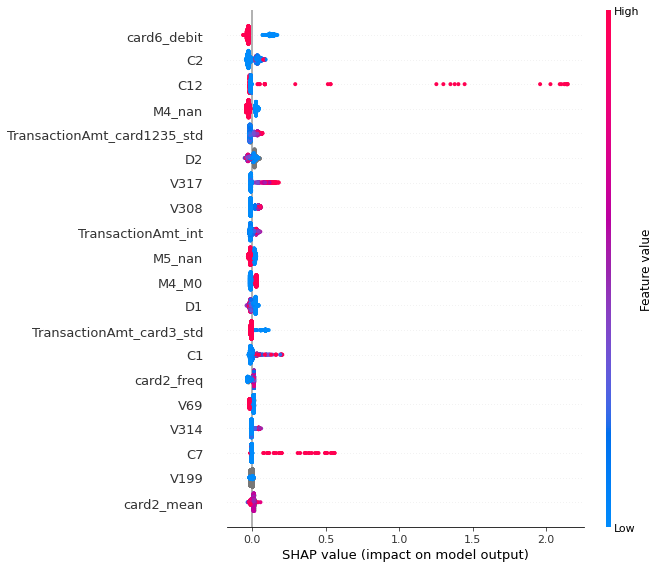

In [124]:
# построить shap.summary_plot
shap.summary_plot(shap_values, x_valid_)

Выводы1: Есть определенные значения в признаках C12, C7 которые оказывают сильное воздействие Таргет модели. Еще в признаке card6_debit, M4_nan, M4_M0 видно сильное разгарничение занчений к целевой переменной.

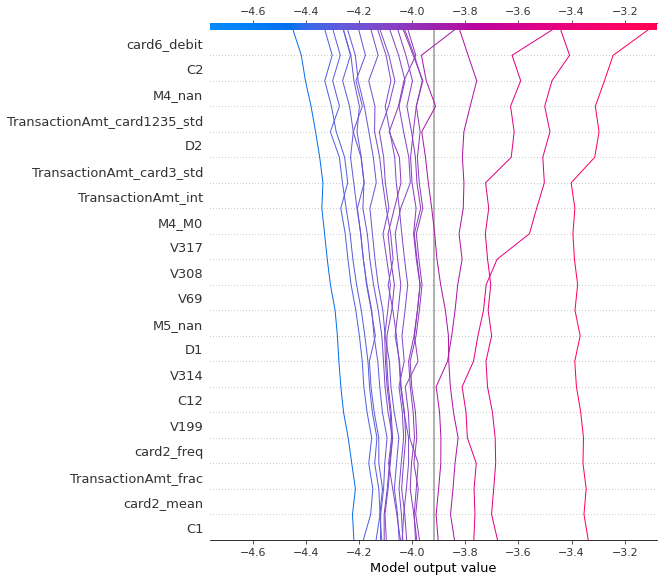

In [127]:
# Посторим shap.decision_plot 
shap.decision_plot(
    expected_value, shap_values, features_display.iloc[:20]
)